<a href="https://colab.research.google.com/github/vatsalpatel2605/Food-101/blob/master/food101.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Importing the libraries

In [1]:
import numpy as np
import os
import cv2
import keras
from keras.models import Model
from os import listdir
from os.path import join
from random import shuffle
from tqdm import tqdm 
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, Activation, Flatten
from keras.utils.np_utils import to_categorical
from keras.optimizers import SGD
import matplotlib.pyplot as plt
from keras.layers.normalization import BatchNormalization
from sklearn.model_selection import train_test_split
from keras.models import load_model
import random

Using TensorFlow backend.


Downloading and Extracting the dataset

In [2]:
if "food-101" in os.listdir():
    print("Dataset already exists")
else:
  !wget http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
  !tar xzvf food-101.tar.gz

Streaming output truncated to the last 5000 lines.
food-101/images/cannoli/1767088.jpg
food-101/images/cannoli/3201965.jpg
food-101/images/cannoli/3778102.jpg
food-101/images/cannoli/2674065.jpg
food-101/images/cannoli/1169899.jpg
food-101/images/cannoli/1378086.jpg
food-101/images/cannoli/803909.jpg
food-101/images/cannoli/1067240.jpg
food-101/images/cannoli/3002709.jpg
food-101/images/cannoli/2612632.jpg
food-101/images/cannoli/3627612.jpg
food-101/images/cannoli/1798703.jpg
food-101/images/cannoli/560632.jpg
food-101/images/cannoli/512468.jpg
food-101/images/cannoli/2331523.jpg
food-101/images/cannoli/3118302.jpg
food-101/images/cannoli/1499412.jpg
food-101/images/cannoli/1557459.jpg
food-101/images/cannoli/146566.jpg
food-101/images/cannoli/96922.jpg
food-101/images/cannoli/1699562.jpg
food-101/images/cannoli/730051.jpg
food-101/images/cannoli/2177977.jpg
food-101/images/cannoli/2767028.jpg
food-101/images/cannoli/6564.jpg
food-101/images/cannoli/553447.jpg
food-101/images/cannoli/

Displaying the different categories of food in the Image folder

In [3]:
!ls food-101/images

apple_pie	    eggs_benedict	     onion_rings
baby_back_ribs	    escargots		     oysters
baklava		    falafel		     pad_thai
beef_carpaccio	    filet_mignon	     paella
beef_tartare	    fish_and_chips	     pancakes
beet_salad	    foie_gras		     panna_cotta
beignets	    french_fries	     peking_duck
bibimbap	    french_onion_soup	     pho
bread_pudding	    french_toast	     pizza
breakfast_burrito   fried_calamari	     pork_chop
bruschetta	    fried_rice		     poutine
caesar_salad	    frozen_yogurt	     prime_rib
cannoli		    garlic_bread	     pulled_pork_sandwich
caprese_salad	    gnocchi		     ramen
carrot_cake	    greek_salad		     ravioli
ceviche		    grilled_cheese_sandwich  red_velvet_cake
cheesecake	    grilled_salmon	     risotto
cheese_plate	    guacamole		     samosa
chicken_curry	    gyoza		     sashimi
chicken_quesadilla  hamburger		     scallops
chicken_wings	    hot_and_sour_soup	     seaweed_salad
chocolate_cake	    hot_dog		     shrimp_and_grits
chocolate_mousse    huevo

Data Visualization of food categories

[]

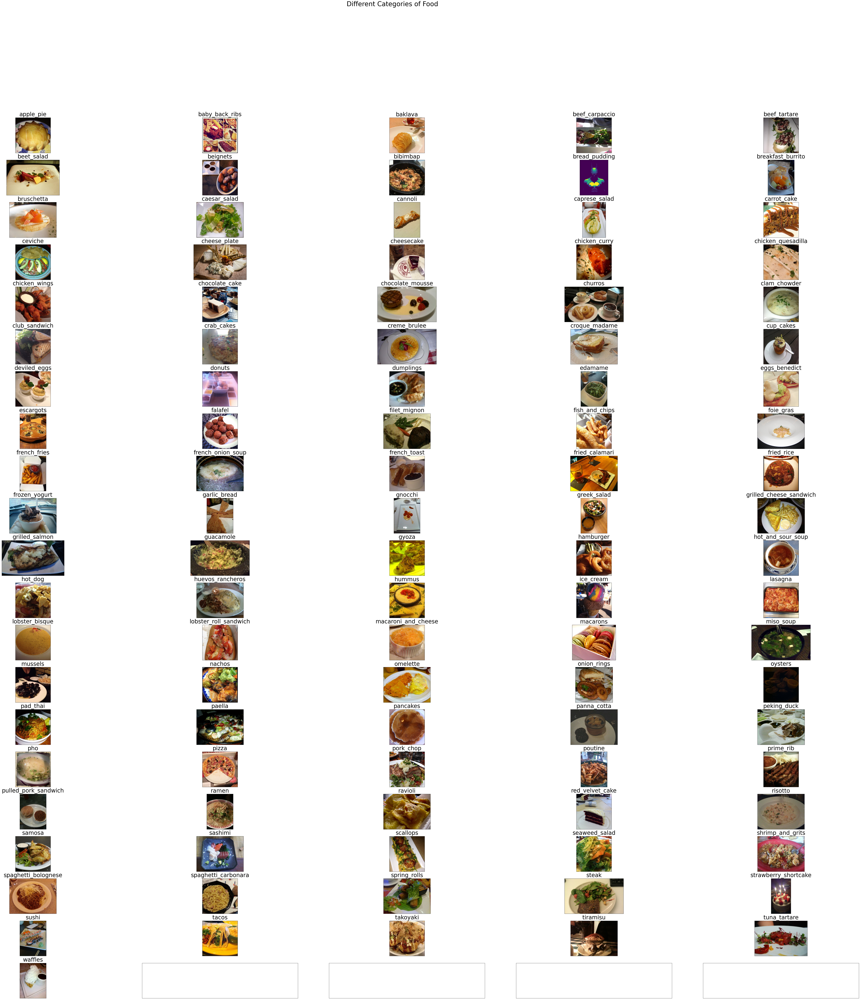

In [4]:
data_dir = "food-101/images/"
food_id = 0
rows = 21
cols = 5
fig, ax = plt.subplots(rows, cols, figsize=(100,100))
foods_sort = sorted(os.listdir(data_dir))
fig.suptitle("Different Categories of Food", fontsize =40)
for i in range(rows):
  for j in range(cols):
    try:
      food = foods_sort[food_id] 
      food_id += 1
    except:
      break
    food_disp = os.listdir(os.path.join(data_dir,food)) 
    food_disp_random = np.random.choice(food_disp) 
    img = plt.imread(os.path.join(data_dir,food, food_disp_random))
    ax[i][j].imshow(img)
    ax[i][j].set_title(food, fontdict = {'fontsize': 35} , pad = 10)
    
plt.setp(ax, xticks=[],yticks=[])


Split data into train and test sets

In [18]:
from shutil import copy
def prepare_data(filepath, src, dest):
  classes_images = defaultdict(list)
  with open(filepath, 'r') as txt:
      paths = [read.strip() for read in txt.readlines()]
      for p in paths:
        food = p.split('/')
        classes_images[food[0]].append(food[1] + '.jpg')

  for food in classes_images.keys():
    if not os.path.exists(os.path.join(dest,food)):
      os.makedirs(os.path.join(dest,food))
    for i in classes_images[food]:
      copy(os.path.join(src,food,i), os.path.join(dest,food,i))

prepare_data('food-101/meta/train.txt', 'food-101/images', 'food-101/train')
print("Train data created")

prepare_data('food-101/meta/test.txt', 'food-101/images', 'food-101/test')
print("Test data created")

Train data created
Test data created


Data Augmentation

In [26]:
train_dir = 'food-101/train'
test_dir = 'food-101/test'

from keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range = 40, width_shift_range = 0.3, height_shift_range = 0.3, shear_range = 0.3, zoom_range = 0.2, horizontal_flip = True)
test_datagen = ImageDataGenerator(rescale=1./255)

print("Training Data Information:")
train_generator = train_datagen.flow_from_directory(
        train_dir, target_size=(150, 150), batch_size=100, class_mode='categorical')

print("\nTesting Data Information:")
test_generator = test_datagen.flow_from_directory(
        test_dir, target_size=(150, 150), batch_size=100, class_mode='categorical')



Training Data Information:
Found 75750 images belonging to 101 classes.

Testing Data Information:
Found 25250 images belonging to 101 classes.


In [27]:
from keras.applications import ResNet50
rnet_model = ResNet50(weights='imagenet', include_top= False)

rnet_model.summary()

/usr/local/lib/python3.6/dist-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


94658560/94653016 [==============================] - 4s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, None, None, 6 256         conv1[0][0]                      
__________________________

In [33]:
from keras.models import Model
from keras.layers import GlobalAveragePooling2D
z = rnet_model.output
z = GlobalAveragePooling2D()(z)
z = Dense(101, activation = 'softmax')(z)

out_rnet_model = Model(inputs=rnet_model.input,outputs=z)


from keras import optimizers
rnet_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

history = rnet_model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=25,
      validation_data=test_generator,
      validation_steps=50)

Epoch 1/25


ValueError: ignored